##**Aquisição dos dados**

In [ ]:
## importações das bibliotecas e dependências.
!pip install matplotlib
!pip install pycaret
!pip install folium

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import folium

from os import listdir
from os.path import isfile, join
from google.colab import drive
from pycaret.utils import enable_colab
from pycaret.datasets import get_data
from pycaret.regression import *
from pycaret.clustering import *
enable_colab()

drive.mount('/gdrive')

In [ ]:
## erro na listagem
#!ls /gdrive/MyDrive/Pasta\ Compartilhada\ -\ Constatação\ de\ Proficiência/Datasets

In [5]:
## adicionando o caminho dos dados
mypath='/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
## criando um dataframe vazio
df_geral = pd.DataFrame()

In [ ]:
## adicionando os dados em um unico dataframe
for file in onlyfiles:
  caminho = mypath + file
  dados = pd.read_csv(caminho)
  df_geral = df_geral.append(dados)
  print(caminho + ' - Adicionado!')

In [7]:
## alterando o tipo da coluna DATA_MOVIMENTO
df_geral['DATA_MOVIMENTO'] = pd.to_datetime(df_geral['DATA_MOVIMENTO'])

##**PRODUTO**

In [8]:
## não utiliza o df_geral, onde as mudanças não implicarão para ou outros setores.
df = df_geral

In [9]:
df.columns

Index(['Unnamed: 0', 'DATA_MOVIMENTO', 'CODIGO_FILIAL', 'UF_FILIAL',
       'CEP_FILIAL', 'STATUS_FILIAL', 'CODIGO_PRODUTO', 'ESTOQUE_ANTERIOR',
       'MVVP_QT_PRD', 'QT_MOV_ENTRADA', 'ESTOQUE_FIM_DIA', 'PRECO_MEDIO_VENDA',
       'QTD_VENDA_PROMOCAO', 'PRECO_LIQUIDO_MEDIO', 'TIPO_PROMOCAO',
       'QTD_VENDA_ULTIMA_CHANCE', 'valorempresa', 'valorconcorrencia'],
      dtype='object')

In [10]:
df = df.drop(columns=['Unnamed: 0','CEP_FILIAL','ESTOQUE_ANTERIOR','QT_MOV_ENTRADA','ESTOQUE_FIM_DIA','QTD_VENDA_ULTIMA_CHANCE','valorempresa','valorconcorrencia'])

In [14]:
df.head()

,DATA_MOVIMENTO,CODIGO_FILIAL,UF_FILIAL,STATUS_FILIAL,CODIGO_PRODUTO,MVVP_QT_PRD,PRECO_MEDIO_VENDA,QTD_VENDA_PROMOCAO,PRECO_LIQUIDO_MEDIO,TIPO_PROMOCAO
0,2019-07-22,23,CE,A,1960,1,24.60,1,24.60,Promo Gold
1,2019-05-08,23,CE,A,1978,1,5.00,1,5.00,Promo Venda
2,2019-08-23,23,CE,A,2378,1,27.08,1,27.08,Promo Gold
3,2019-06-15,23,CE,A,4586,1,5.69,1,5.69,Promo Venda
4,2019-04-04,23,CE,A,1978,1,5.00,1,5.00,Promo Venda


In [15]:
plt.style.use('ggplot')

In [16]:
#Promoção com mais ações de compra

df[u'TIPO_PROMOCAO'].value_counts()

Promo Venda         1122114
Promo Gold           463479
Promo Bronze         435434
Encarte              346116
Desconto Cupom       142477
Acordo               105355
Desconto Proprio     105015
SEMPROMOCAO           88209
Promo Senior          80825
LeveXPagueY           69256
Promo Friday           4902
Name: TIPO_PROMOCAO, dtype: int64

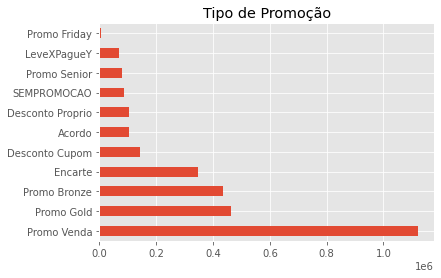

In [17]:
df[u'TIPO_PROMOCAO'].value_counts().plot.barh(title="Tipo de Promoção")

In [18]:
#Produto mais vendido na Promo Venda

df[df['TIPO_PROMOCAO'] == u'Promo Venda'][u'CODIGO_PRODUTO'].value_counts().head(10)

9439     3251
13082    3210
46533    3185
1978     3026
36657    2726
2699     2721
908      2610
52677    2568
3056     2357
36389    2313
Name: CODIGO_PRODUTO, dtype: int64

In [19]:
#Os 10 produtos mais vendidos da empresa

df[u'CODIGO_PRODUTO'].value_counts().head(10)

27454    9553
15757    9309
6520     7268
36422    6786
2699     6510
18537    6442
18064    6396
46533    6385
47676    6152
29181    5405
Name: CODIGO_PRODUTO, dtype: int64

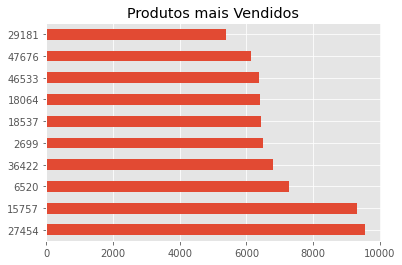

In [20]:
df[u'CODIGO_PRODUTO'].value_counts().head(10).plot.barh(title="Produtos mais Vendidos")

In [21]:
#Dias que mais ocorreram ações de compra

df.groupby('DATA_MOVIMENTO')['CODIGO_PRODUTO'].count().sort_values(ascending=False)

DATA_MOVIMENTO
2019-03-01    22368
2019-07-05    18336
2019-03-02    17975
2019-07-02    17945
2019-03-30    17943
              ...  
2019-03-05    11435
2019-07-21    11327
2019-04-14    11277
2019-07-28    11276
2019-04-21    10830
Name: CODIGO_PRODUTO, Length: 195, dtype: int64

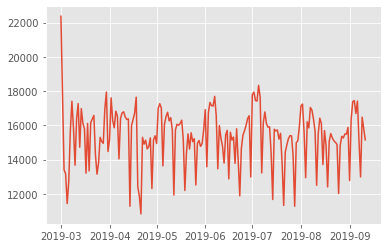

In [22]:
plt.plot(df.groupby('DATA_MOVIMENTO')['CODIGO_PRODUTO'].count())

In [23]:
#Quantidade de vendas por filial
df.groupby('CODIGO_FILIAL')['CODIGO_PRODUTO'].value_counts()

CODIGO_FILIAL  CODIGO_PRODUTO
1              27454             562
               15757             518
               2699              509
               36422             508
               18537             499
                                ... 
72             54306               1
               54356               1
               54360               1
               54371               1
               54387               1
Name: CODIGO_PRODUTO, Length: 178902, dtype: int64

In [24]:
#Quantidade total de vendas por produto

df.groupby('CODIGO_PRODUTO')['CODIGO_PRODUTO'].count().sort_values(ascending=False)

CODIGO_PRODUTO
27454    9553
15757    9309
6520     7268
36422    6786
2699     6510
         ... 
52816       1
52803       1
52802       1
52800       1
51683       1
Name: CODIGO_PRODUTO, Length: 13743, dtype: int64

In [25]:
#Reunindo dados de vendas

lojas_kmens = df.copy()
lojas_kmens = lojas_kmens.drop(['PRECO_MEDIO_VENDA','CODIGO_PRODUTO','DATA_MOVIMENTO','UF_FILIAL','STATUS_FILIAL','QTD_VENDA_PROMOCAO','TIPO_PROMOCAO'], axis=1)
lojas_kmens

,CODIGO_FILIAL,MVVP_QT_PRD,PRECO_LIQUIDO_MEDIO
0,23,1,24.60
1,23,1,5.00
2,23,1,27.08
3,23,1,5.69
4,23,1,5.00
...,...,...,...
202044,67,2,34.99
202045,67,1,14.90
202046,67,1,14.70
202047,67,1,9.90


In [26]:
#Montando dados para clusterização

lojas = lojas_kmens.groupby('CODIGO_FILIAL')['MVVP_QT_PRD'].sum().reset_index()

In [27]:
lojas

,CODIGO_FILIAL,MVVP_QT_PRD
0,1,659879
1,3,131767
2,5,165770
3,11,116793
4,15,126247
5,18,409681
6,20,317779
7,22,113499
8,23,131452
9,27,158075


In [29]:
#Clusterizando

N_CLUSTERS = 3

kmeans = KMeans(
    n_clusters=N_CLUSTERS,
    max_iter=500,
    n_init=10,
    n_jobs=-1,
    random_state=1
)

kmeans.fit(lojas)

NameError: ignored

In [30]:
#Inserindo a classificação de cada loja

lojas['clusters'] = kmeans.labels_

NameError: ignored

In [ ]:
#Organizando as lojas baseando no faturado e cluster

lojas.sort_values(['MVVP_QT_PRD','clusters'])

,CODIGO_FILIAL,MVVP_QT_PRD,clusters
16,58,110546,0
7,22,113499,0
3,11,116793,0
19,72,125695,0
4,15,126247,0
8,23,131452,0
1,3,131767,0
9,27,158075,0
2,5,165770,0
14,46,173872,0


In [ ]:
d1 = df.groupby('CODIGO_PRODUTO')['MVVP_QT_PRD'].sum().reset_index()

In [ ]:
d11 = df.groupby('CODIGO_PRODUTO')['MVVP_QT_PRD'].max().reset_index()

In [ ]:
d2 = df.groupby('CODIGO_PRODUTO')['PRECO_MEDIO_VENDA'].std().reset_index()

In [ ]:
d22 = df.groupby('CODIGO_PRODUTO')['PRECO_MEDIO_VENDA'].mean().reset_index()

In [ ]:
d23 = df.groupby('CODIGO_PRODUTO')['PRECO_MEDIO_VENDA'].max().reset_index()

In [ ]:
d4 = df.groupby('CODIGO_PRODUTO')['CODIGO_PRODUTO'].count().reset_index(name='Counts')

In [ ]:
d1['Preco Medio de Venda'] = d22['PRECO_MEDIO_VENDA']
d1['Preco Maximo'] = d23['PRECO_MEDIO_VENDA']
d1['Desvio do Preco'] = d2['PRECO_MEDIO_VENDA']
d1['Quantidade de Vendas'] = d4['Counts']
d1['Maxima de Vendas'] = d11['MVVP_QT_PRD']

In [ ]:
d0 = d1.drop('CODIGO_PRODUTO', axis=1)

In [ ]:
d0

,MVVP_QT_PRD,Preco Medio de Venda,Preco Maximo,Desvio do Preco,Quantidade de Vendas,Maxima de Vendas
0,3746,108.829474,923.00,82.410162,398,77
1,3,67.333333,70.65,4.664315,3,1
2,1,0.590000,0.59,NaN,1,1
3,775,55.180054,61.90,3.238016,336,15
4,474,18.696846,22.35,1.595695,149,10
...,...,...,...,...,...,...
13738,4,2.490000,2.49,0.000000,4,1
13739,15,2.490000,2.49,0.000000,8,4
13740,17,2.490000,2.49,0.000000,10,3
13741,4,2.490000,2.49,0.000000,4,1


In [ ]:
data = d0.sample(frac=0.95, random_state=786)
data_unseen = d0.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (13056, 6)
Unseen Data For Predictions: (687, 6)


In [ ]:
data.head()

,MVVP_QT_PRD,Preco Medio de Venda,Preco Maximo,Desvio do Preco,Quantidade de Vendas,Maxima de Vendas
0,175,27.158706,30.75,1.781428,170,2
1,2,33.990000,33.99,0.000000,2,1
2,2379,5.630477,12.58,5.876141,1217,16
3,99,29.265208,30.71,0.149011,96,2
4,411,31.274555,38.80,1.198991,262,5


In [ ]:
## importado no inicio
#from pycaret.clustering import *

exp_clu101 = setup(data, normalize = True,
                   session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(13056, 6)"
2,Missing Values,True
3,Numeric Features,6
4,Categorical Features,0
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(13056, 6)"
9,CPU Jobs,-1


2021-04-17 14:22:14.906 INFO    logs: create_model_container: 0
2021-04-17 14:22:14.907 INFO    logs: master_model_container: 0
2021-04-17 14:22:14.919 INFO    logs: display_container: 1
2021-04-17 14:22:14.933 INFO    logs: Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numerical=None...
                ('P_transform', 'passthrough'), ('binn', 'passthrough'),
                ('rem

In [ ]:
kmeans = create_model('kmeans',num_clusters=8)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.4487,5005.1624,0.8209,0,0,0


2021-04-17 14:22:27.658 INFO    logs: create_model_container: 1
2021-04-17 14:22:27.661 INFO    logs: master_model_container: 1
2021-04-17 14:22:27.664 INFO    logs: display_container: 2
2021-04-17 14:22:27.666 INFO    logs: KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)
2021-04-17 14:22:27.667 INFO    logs: create_model() succesfully completed......................................


In [ ]:
kmean_results = assign_model(kmeans)
kmean_results

2021-04-17 14:22:30.585 INFO    logs: Initializing assign_model()
2021-04-17 14:22:30.586 INFO    logs: assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
2021-04-17 14:22:30.590 INFO    logs: Checking exceptions
2021-04-17 14:22:30.597 INFO    logs: Determining Trained Model
2021-04-17 14:22:30.600 INFO    logs: Trained Model : K-Means Clustering
2021-04-17 14:22:30.606 INFO    logs: Copying data
2021-04-17 14:22:30.625 INFO    logs: (13056, 7)
2021-04-17 14:22:30.629 INFO    logs: assign_model() succesfully completed......................................


,MVVP_QT_PRD,Preco Medio de Venda,Preco Maximo,Desvio do Preco,Quantidade de Vendas,Maxima de Vendas,Cluster
0,175,27.158706,30.75,1.781428,170,2,Cluster 1
1,2,33.990000,33.99,0.000000,2,1,Cluster 1
2,2379,5.630477,12.58,5.876141,1217,16,Cluster 0
3,99,29.265208,30.71,0.149011,96,2,Cluster 1
4,411,31.274555,38.80,1.198991,262,5,Cluster 1
...,...,...,...,...,...,...,...
13051,116,64.539885,70.75,4.985599,87,4,Cluster 7
13052,10,93.247000,113.75,7.641652,10,1,Cluster 7
13053,73,55.940952,64.25,7.935839,63,3,Cluster 7
13054,1,4.990000,4.99,NaN,1,1,Cluster 1


In [ ]:
plot_model(kmeans)

2021-04-17 14:22:36.446 INFO    logs: Rendering Visual


2021-04-17 14:22:37.110 INFO    logs: Visual Rendered Successfully
2021-04-17 14:22:37.419 INFO    logs: plot_model() succesfully completed......................................


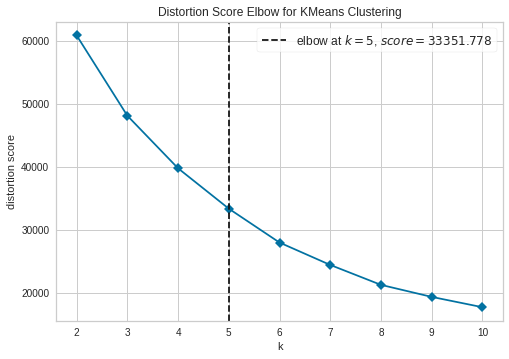

In [ ]:
plot_model(kmeans, plot = 'elbow')

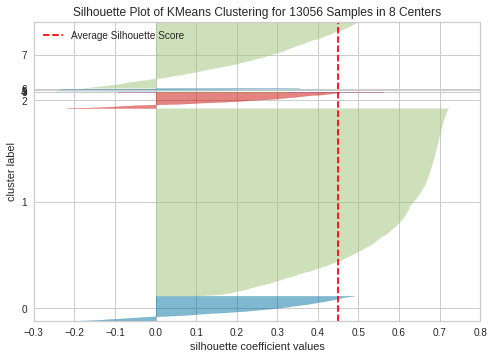

In [ ]:
plot_model(kmeans, plot = 'silhouette')

In [ ]:
plot_model(kmeans, plot = 'distribution')

In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'Preco Medio de Venda')

In [ ]:
unseen_predictions = predict_model(kmeans, data=data_unseen)
unseen_predictions.head()

2021-04-17 14:28:04.343 INFO    logs: Initializing predict_model()
2021-04-17 14:28:04.348 INFO    logs: predict_model(estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), ml_usecase=MLUsecase.CLUSTERING)


,MVVP_QT_PRD,Preco Medio de Venda,Preco Maximo,Desvio do Preco,Quantidade de Vendas,Maxima de Vendas,Cluster
0,2070,14.444985,16.85,0.781946,460,17,Cluster 0
1,103,9.089538,10.40,0.761365,65,7,Cluster 1
2,52,129.816458,144.95,8.887225,48,2,Cluster 2
3,360,8.669862,9.55,0.678201,290,6,Cluster 1
4,517,11.647163,13.20,0.862594,141,13,Cluster 1


In [ ]:
save_model(kmeans,'Modelo de Produtos Kmeans')

2021-04-17 14:28:44.259 INFO    logs: Initializing save_model()
2021-04-17 14:28:44.261 INFO    logs: save_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), model_name=Modelo de Produtos Kmeans, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
               

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KMe

In [ ]:
saved_kmeans = load_model('Modelo de Produtos Kmeans')

2021-04-17 14:28:56.637 INFO    logs: Initializing load_model()
2021-04-17 14:28:56.642 INFO    logs: load_model(model_name=Modelo de Produtos Kmeans, platform=None, authentication=None, verbose=True)


Transformation Pipeline and Model Successfully Loaded


In [ ]:
d0.describe()

,MVVP_QT_PRD,Preco Medio de Venda,Preco Maximo,Desvio do Preco,Quantidade de Vendas,Maxima de Vendas
count,13743.000000,13743.000000,13743.000000,13136.000000,13743.000000,13743.000000
mean,345.747144,38.599568,43.752202,3.356555,217.881976,4.223314
std,1671.796949,49.550000,57.496544,5.801052,441.592919,10.777191
min,1.000000,0.005000,0.010000,0.000000,1.000000,1.000000
25%,19.000000,10.704659,12.490000,0.624475,18.000000,1.000000
50%,80.000000,22.564000,25.850000,1.630591,72.000000,2.000000
75%,269.500000,47.704286,54.025000,4.026460,225.000000,4.000000
max,113563.000000,1101.650000,1266.250000,208.868540,9553.000000,570.000000


##**VENDAS**

In [ ]:
## já importado
#import numpy as np
#import pandas as pd
#from os import listdir

In [ ]:
## já importado
#from google.colab import drive
#drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [ ]:
vendas11 = pd.read_csv('/gdrive/MyDrive/Classroom/Pasta Compartilhada - Constatação de Proficiência/Datasets/vendas_11_clean.csv')

In [ ]:
vendas11['DATA_MOVIMENTO'] = pd.to_datetime(vendas11['DATA_MOVIMENTO'])

In [ ]:
vendas11['DIA_DA_SEMANA']= vendas11['DATA_MOVIMENTO'].dt.weekday

In [ ]:
vendas11=vendas11.drop(['DATA_MOVIMENTO','Unnamed: 0','UF_FILIAL','STATUS_FILIAL','TIPO_PROMOCAO','PRECO_LIQUIDO_MEDIO','PRECO_MEDIO_VENDA','CEP_FILIAL','valorempresa','valorconcorrencia'], axis=1)

In [ ]:
vendas11

,CODIGO_FILIAL,CODIGO_PRODUTO,ESTOQUE_ANTERIOR,MVVP_QT_PRD,QT_MOV_ENTRADA,ESTOQUE_FIM_DIA,QTD_VENDA_PROMOCAO,QTD_VENDA_ULTIMA_CHANCE,DIA_DA_SEMANA
0,11,375,6,1,1,6,1,0,4
1,11,407,9,1,1,9,1,0,3
2,11,1344,28,4,1,24,4,0,2
3,11,407,12,1,0,11,1,0,6
4,11,8,19,2,0,17,2,0,6
...,...,...,...,...,...,...,...,...,...
79585,11,49309,10,1,0,7,1,0,5
79586,11,49945,7,1,0,5,1,0,1
79587,11,50560,2,1,0,1,1,0,6
79588,11,50763,7,1,0,6,1,0,2


In [ ]:
# já importado
#pip install pycaret

In [ ]:
# já importado
#from pycaret.datasets import get_data
dataset = vendas11.copy()

In [ ]:
dataset.shape

(79590, 9)

In [ ]:
data = dataset.sample(frac=0.9, random_state=786)
data_unseen = dataset.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (71631, 9)
Unseen Data For Predictions: (7959, 9)


In [ ]:
# já importado
#from pycaret.regression import *
exp_reg101 = setup(data = data, target = 'MVVP_QT_PRD', session_id=123)

,Description,Value
0,session_id,123
1,Target,MVVP_QT_PRD
2,Original Data,"(71631, 9)"
3,Missing Values,False
4,Numeric Features,5
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(50141, 22)"


In [ ]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.0202,0.1403,0.3603,0.9532,0.0424,0.0067,2.640
rf,Random Forest Regressor,0.0200,0.1485,0.3707,0.9511,0.0427,0.0071,4.174
gbr,Gradient Boosting Regressor,0.0340,0.1887,0.4206,0.9379,0.0579,0.0164,3.224
dt,Decision Tree Regressor,0.0258,0.2431,0.4776,0.9185,0.0570,0.0085,0.086
lightgbm,Light Gradient Boosting Machine,0.0462,0.4361,0.6496,0.8526,0.0641,0.0148,0.366
ridge,Ridge Regression,0.1470,0.7732,0.8741,0.7370,0.1315,0.0790,0.032
br,Bayesian Ridge,0.1470,0.7732,0.8741,0.7370,0.1314,0.0790,0.064
lr,Linear Regression,0.1470,0.7732,0.8742,0.7370,0.1315,0.0790,0.295
lar,Least Angle Regression,0.1472,0.7737,0.8745,0.7368,0.1315,0.0791,0.037
omp,Orthogonal Matching Pursuit,0.1460,0.9033,0.9394,0.6941,0.1562,0.0779,0.034


In [ ]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [ ]:
ada = create_model('ada')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.6813,1.0314,1.0156,0.6949,0.2907,0.5758
1,1.1754,2.0051,1.4160,0.2987,0.4464,1.0301
2,0.8128,1.1238,1.0601,0.4923,0.3243,0.6656
3,0.6752,0.8090,0.8995,0.7098,0.2831,0.5643
4,0.7235,1.1140,1.0555,0.6451,0.3025,0.6157
5,0.6000,0.7368,0.8584,0.7868,0.2455,0.4819
6,0.5520,0.7220,0.8497,0.7239,0.2252,0.4091
7,0.6331,1.0738,1.0362,0.6999,0.2621,0.5070
8,1.1358,1.5701,1.2530,0.3753,0.4481,1.0471
9,0.8979,1.3972,1.1820,0.5924,0.3614,0.7794


In [ ]:
print(ada)

AdaBoostRegressor(base_estimator=None, learning_rate=1.0, loss='linear',
                  n_estimators=50, random_state=123)


In [ ]:
lightgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.0422,0.5621,0.7497,0.8337,0.0606,0.0133
1,0.0555,0.5544,0.7446,0.8061,0.0754,0.0169
2,0.0392,0.2608,0.5107,0.8822,0.0545,0.0120
3,0.0378,0.1781,0.4220,0.9361,0.0514,0.0125
4,0.0486,0.5472,0.7397,0.8257,0.0693,0.0150
5,0.0454,0.2978,0.5457,0.9138,0.0620,0.0164
6,0.0457,0.6699,0.8185,0.7438,0.0621,0.0134
7,0.0513,0.4874,0.6981,0.8638,0.0698,0.0157
8,0.0480,0.4259,0.6526,0.8305,0.0726,0.0184
9,0.0486,0.3773,0.6142,0.8899,0.0633,0.0149


In [ ]:
dt = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.0251,0.3501,0.5917,0.8964,0.0593,0.0074
1,0.0328,0.2908,0.5393,0.8983,0.0663,0.0105
2,0.0193,0.1143,0.3381,0.9484,0.0452,0.0053
3,0.0199,0.1296,0.3601,0.9535,0.0405,0.0049
4,0.0234,0.2918,0.5402,0.9070,0.0688,0.0135
5,0.0257,0.1792,0.4233,0.9481,0.0600,0.0101
6,0.0313,0.5076,0.7124,0.8059,0.0562,0.0093
7,0.0257,0.1849,0.4300,0.9483,0.0551,0.0088
8,0.0178,0.0892,0.2986,0.9645,0.0515,0.0072
9,0.0373,0.2938,0.5420,0.9143,0.0672,0.0077


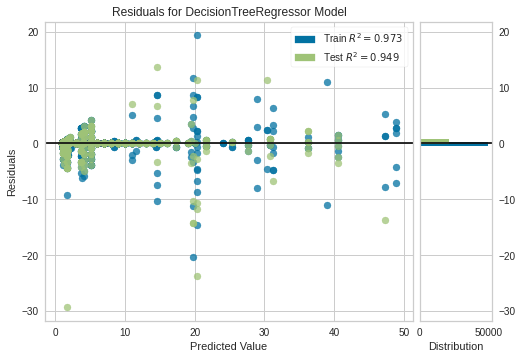

In [ ]:
tuned_dt = tune_model(dt)
plot_model(tuned_dt)

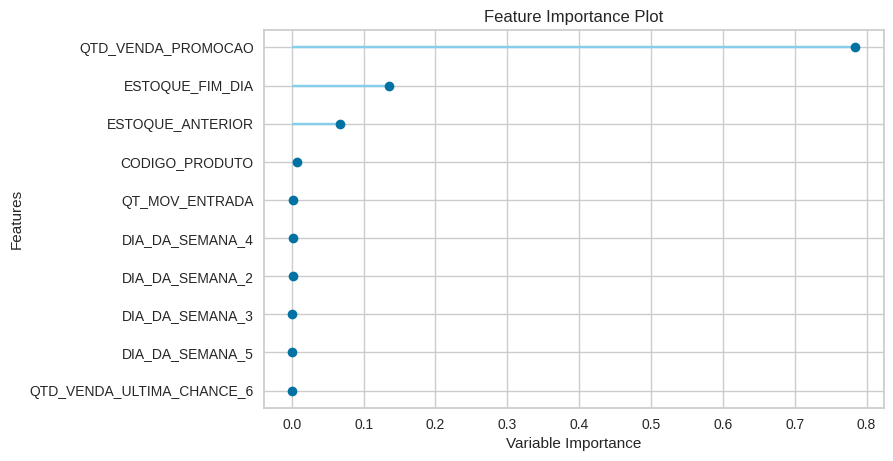

In [ ]:
plot_model(tuned_dt, plot='feature')

In [ ]:
predict_model(tuned_dt)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Decision Tree Regressor,0.0233,0.1686,0.4106,0.9486,0.0464,0.0072


In [ ]:
save_model(tuned_dt,'Modelo Final')

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='MVVP_QT_PRD', time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_stra...
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  DecisionTreeRegressor(ccp_alpha=0.0, criterion='friedman_mse',
                                        max_depth=10, max_features=1.0,
                                        max_leaf_nodes=None,

In [ ]:
Criar arquivo .py e anexar com streamlit

import streamlit as st
import pandas as pd
import numpy as np
from pycaret.classification import load_model, predict_model

def predict_quality(model, df):
    
    predictions_data = predict_model(estimator = model, data = df)
    
    return predictions_data['Label'][0]

model = load_model('Modelo Final')


st.title('Proficiência Unichristus')

st.write("Exemplo Streamlit - Unichristus")

CODIGO_FILIAL = st.sidebar.slider(label='CODIGO_FILIAL', min_value=0,
                                   max_value= 11, value= 11, step=1)

CODIGO_PRODUTO = st.sidebar.slider(label='CODIGO_PRODUTO', min_value=0,
                                   max_value= 54473, value= 10, step=1)

ESTOQUE_ANTERIOR = st.sidebar.slider(label='ESTOQUE_ANTERIOR', min_value=0,
                                   max_value= 707, value= 10, step=1)

QT_MOV_ENTRADA = st.sidebar.slider(label='QT_MOV_ENTRADA', min_value=0,
                                   max_value= 688, value= 10, step=1)

ESTOQUE_FIM_DIA = st.sidebar.slider(label='ESTOQUE_FIM_DIA', min_value=0,
                                   max_value= 1366, value= 10, step=1)

QTD_VENDA_PROMOCAO = st.sidebar.slider(label='QTD_VENDA_PROMOCAO', min_value=0,
                                   max_value= 56, value= 10, step=1)

QTD_VENDA_ULTIMA_CHANCE = st.sidebar.slider(label='QTD_VENDA_ULTIMA_CHANCE', min_value=0,
                                   max_value= 14, value= 10, step=1)

DIA_DA_SEMANA = st.sidebar.slider(label='DIA_DA_SEMANA', min_value=0,
                                  max_value= 6, value= 10, step=1)



features = {'CODIGO_FILIAL': CODIGO_FILIAL, 'CODIGO_PRODUTO': CODIGO_PRODUTO, 'ESTOQUE_ANTERIOR': ESTOQUE_ANTERIOR, 'QT_MOV_ENTRADA': QT_MOV_ENTRADA, 'ESTOQUE_FIM_DIA': ESTOQUE_FIM_DIA,'QTD_VENDA_PROMOCAO' : QTD_VENDA_PROMOCAO, 'QTD_VENDA_ULTIMA_CHANCE': QTD_VENDA_ULTIMA_CHANCE,  'DIA_DA_SEMANA': DIA_DA_SEMANA} 


features_df = pd.DataFrame([features])

st.table(features_df)

if st.button('Predizer'):

    # realizar a predição do modelo
    predicao = predict_quality(model, features_df)


    st.write('A quantidade de pecas vendidas sera de '+ str(predicao)) 

##**LOJAS**

In [32]:
## buscando o df_geral
df = df_geral

### analise dos dados

In [33]:
## removendo coluna desnecessária
df.drop('Unnamed: 0', axis=1, inplace=True)

In [35]:
## ordenando o dataframe pelos números dos códigos de filiais
df.sort_values('CODIGO_FILIAL', inplace=True, ignore_index=True)

In [36]:
## verificando o número de filiais
cod_filial_unico = df['CODIGO_FILIAL'].unique()
numero_de_cod = 0
for cod in cod_filial_unico:
  numero_de_cod += 1
print('Total de ' + str(numero_de_cod) + ' códigos de filiais')
print(cod_filial_unico)

Total de 20 códigos de filiais
[ 1  3  5 11 15 18 20 22 23 27 31 36 37 45 46 57 58 67 69 72]


In [37]:
## verificando as filiais pela coluna UF_FILIAL
df['UF_FILIAL'].unique()

array(['CE'], dtype=object)

In [38]:
## verificando as filiais pela coluna CEP_FILIAL
cep_filial_unico = df['CEP_FILIAL'].unique()
numero_de_cep = 0
for cep in cep_filial_unico:
  numero_de_cep += 1
print('Total de ' + str(numero_de_cep) + ' CEP de filiais')
print(cep_filial_unico)

Total de 20 CEP de filiais
['60025-001' '60165-130' '62320-000' '60425-000' '60425-681' '60010-450'
 '60333-030' '60356-001' '60025-130' '60455-410' '60347-440' '60050-040'
 '60170-250' '60165-011' '60055-210' '60720-000' '60325-000' '60150-160'
 '60730-202' '60811-340']


In [39]:
## verificando dados null
df.isnull().sum()

DATA_MOVIMENTO                   0
CODIGO_FILIAL                    0
UF_FILIAL                        0
CEP_FILIAL                       0
STATUS_FILIAL                    0
CODIGO_PRODUTO                   0
ESTOQUE_ANTERIOR              1795
MVVP_QT_PRD                      0
QT_MOV_ENTRADA                   0
ESTOQUE_FIM_DIA               1795
PRECO_MEDIO_VENDA                0
QTD_VENDA_PROMOCAO               0
PRECO_LIQUIDO_MEDIO              0
TIPO_PROMOCAO                31170
QTD_VENDA_ULTIMA_CHANCE          0
valorempresa               1545877
valorconcorrencia          1545877
dtype: int64

In [40]:
## verificando dados NaN
df.isna().sum()

DATA_MOVIMENTO                   0
CODIGO_FILIAL                    0
UF_FILIAL                        0
CEP_FILIAL                       0
STATUS_FILIAL                    0
CODIGO_PRODUTO                   0
ESTOQUE_ANTERIOR              1795
MVVP_QT_PRD                      0
QT_MOV_ENTRADA                   0
ESTOQUE_FIM_DIA               1795
PRECO_MEDIO_VENDA                0
QTD_VENDA_PROMOCAO               0
PRECO_LIQUIDO_MEDIO              0
TIPO_PROMOCAO                31170
QTD_VENDA_ULTIMA_CHANCE          0
valorempresa               1545877
valorconcorrencia          1545877
dtype: int64

In [41]:
## verificando os status A e F das filiais
a = df.loc[df.STATUS_FILIAL == 'A']
f = df.loc[df.STATUS_FILIAL == 'F']

In [42]:
## preenchendo dados faltantes com 0 (zero)
df.fillna(0, inplace=True)

In [45]:
## criando a coluna faturamento
df['FATURAMENTO'] = ((df['MVVP_QT_PRD'] - df['QTD_VENDA_PROMOCAO']) + 
                      (df['QTD_VENDA_PROMOCAO'] * df['PRECO_LIQUIDO_MEDIO']))

In [47]:
## recuperando somente as colunas necessárias
df_faturamento = df[['DATA_MOVIMENTO', 'CODIGO_FILIAL', 'CODIGO_PRODUTO', 'FATURAMENTO', 'TIPO_PROMOCAO']]
df_faturamento.sort_values('DATA_MOVIMENTO', inplace=True)
df_faturamento.rename(str.lower, axis='columns', inplace=True)

In [48]:
## faturamento total por filial
faturamento_por_filial = df_faturamento.groupby(['codigo_filial', 'codigo_produto']).sum()

In [49]:
## separar meses para analisar o faturamento mensal de cada filial
datas = pd.to_datetime(df_faturamento['data_movimento'])

df_faturamento['dia'] = datas.dt.day
df_faturamento['mes'] = datas.dt.month
df_faturamento['ano'] = datas.dt.year

In [50]:
## formata a saída de números float
pd.options.display.float_format = '${:,.2f}'.format

In [51]:
## função para agrupar
def agrupar(coluna, metodo, ordenar):
  if metodo == 'sum':
    df = df_faturamento.groupby(str(coluna)).sum().sort_values(str(ordenar), ascending=False)
    return df.reset_index(str(coluna))
  elif metodo == 'count':
    df = df_faturamento.groupby(str(coluna)).count().sort_values(str(ordenar), ascending=False)
    return df.reset_index(str(coluna))
  else:
    print('erro')

In [52]:
filial_com_maior_movimento = agrupar('codigo_filial', 'count', 'data_movimento')

In [53]:
produtos_mais_vendidos = agrupar('codigo_produto', 'count', 'data_movimento')

In [54]:
dia_com_maior_movimento = agrupar('dia', 'count', 'data_movimento')

In [55]:
mes_com_maior_movimento = agrupar('mes', 'count', 'data_movimento')

In [56]:
filial_com_maior_faturamento = agrupar('codigo_filial', 'sum', 'faturamento')

In [57]:
mes_com_maior_faturamento = agrupar('mes', 'sum', 'faturamento')

### plotando gráficos

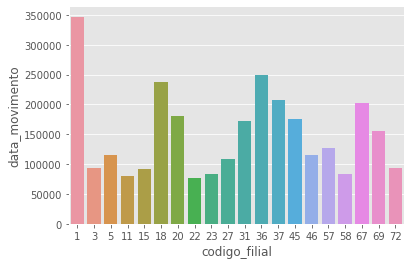

In [58]:
sns.barplot(x='codigo_filial', y='data_movimento', data=filial_com_maior_movimento)

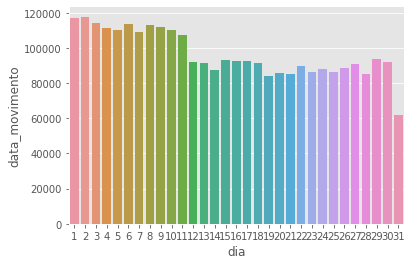

In [61]:
sns.barplot(x='dia', y='data_movimento', data=dia_com_maior_movimento)

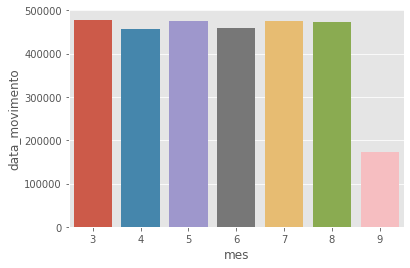

In [63]:
sns.barplot(x='mes', y='data_movimento', data=mes_com_maior_movimento)

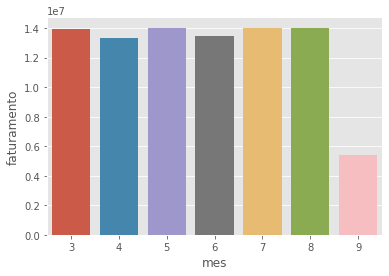

In [64]:
sns.barplot(x='mes', y='faturamento', data=mes_com_maior_faturamento)

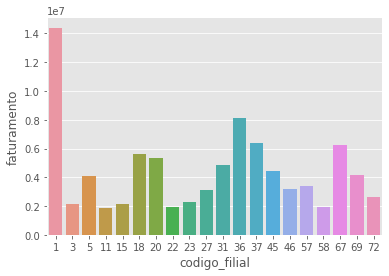

In [65]:
sns.barplot(x='codigo_filial', y='faturamento', data=filial_com_maior_faturamento)

### ml com pycaret

In [66]:
grouped = df_faturamento.groupby(['codigo_filial','codigo_produto']).sum()
grouped_drop = grouped.drop(columns=['dia', 'mes', 'ano'])

In [69]:
df_pivot = pd.pivot_table(
  grouped_drop,
  index=['codigo_filial'],
  columns=['codigo_produto'],
  values='faturamento'
)

In [70]:
df_pivot.reset_index('codigo_filial', inplace=True)
df_pivot.fillna(value=0, inplace=True)
dataset = df_pivot

In [72]:
data = dataset.sample(frac=0.95, random_state=786)
data_unseen = dataset.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (19, 13744)
Unseen Data For Predictions: (1, 13744)


In [77]:
exp_clu101 = setup(data, normalize = True)

,Description,Value
0,session_id,8329
1,Original Data,"(19, 13744)"
2,Missing Values,False
3,Numeric Features,12712
4,Categorical Features,1032
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(19, 14793)"
9,CPU Jobs,-1


In [78]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,$0.22,$5.02,$1.01,0,0,0


In [79]:
kmodes = create_model('kmodes', num_clusters = 6)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,$-0.15,$0.69,$1.70,0,0,0


In [80]:
kmean_results = assign_model(kmeans)

In [81]:
plot_model(kmeans)

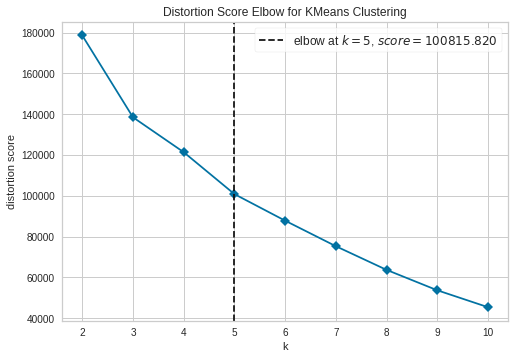

In [82]:
plot_model(kmeans, plot = 'elbow')

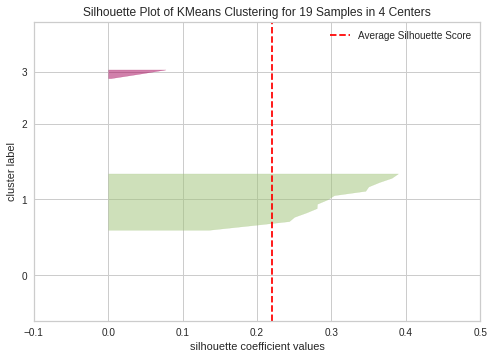

In [83]:
plot_model(kmeans, plot = 'silhouette')

In [84]:
plot_model(kmeans, plot = 'distribution')

In [85]:
unseen_predictions = predict_model(kmeans, data=data_unseen)
unseen_predictions.head()

codigo_produto,codigo_filial,1,3,5,8,9,10,11,18,23,27,31,34,35,40,50,63,69,70,83,84,85,88,99,100,102,103,115,119,128,149,153,157,173,175,177,178,182,188,191,...,54369,54371,54372,54373,54376,54377,54380,54384,54387,54388,54391,54395,54396,54397,54398,54399,54400,54401,54402,54414,54417,54418,54421,54423,54426,54427,54429,54432,54434,54443,54454,54458,54459,54470,54471,54472,54473,54474,54477,Cluster
0,31,$0.00,$69.35,$0.00,"$1,461.74","$1,023.04","$5,103.92",$0.00,$27.90,$0.00,$0.00,$0.00,"$1,316.82",$463.93,$0.00,$0.00,$0.00,"$1,083.41",$554.41,$0.00,$0.00,$18.38,$0.00,$1.50,$390.08,$0.00,$0.00,$0.00,$0.00,"$1,021.77",$0.00,"$1,413.70",$338.09,$872.39,$598.32,$131.11,$655.11,$0.00,$0.00,$0.00,...,$0.00,$0.00,$0.00,$210.00,$32.83,$0.00,$74.96,$0.00,$38.80,$0.00,$0.00,$49.99,$49.99,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$41.86,$19.60,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$0.00,$80.00,Cluster 1


In [86]:
save_model(kmeans,'KMeans_Model_Claydiberto')


Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='UNSUPERVISED_DUMMY_TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='most frequent',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None...
                 ('fix_perfect', 'passthrough'),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  KMe

### plot em mapa

In [87]:
df_cep = df[['CODIGO_FILIAL', 'CEP_FILIAL']]

## formata a saída de números float para lat e lon
pd.options.display.float_format = '{:,.7f}'.format

In [88]:
#site da pesquisa: https://www.mapacep.com.br/index.php
lat_lon = {'CEP_FILIAL': ['60025-001', '60165-130', '62320-000', '60425-000', '60425-681',
       '60010-450', '60333-030', '60356-001', '60025-130', '60455-410',
       '60347-440', '60050-040', '60170-250', '60165-011', '60055-210',
       '60720-000', '60325-000', '60150-160', '60730-202', '60811-340'],
            'lat': [-3.7341236, -3.7228863, -3.730129, -3.7620268, -3.7558042, 
                    -3.7144411, -3.7511920, -3.7384174, -3.7352081, -3.7398642,
                    -3.7158550, -3.7373965, -3.7397900, -3.7240304, -3.7434373,
                    -3.8242085, -3.7312503, -3.7346716, -3.8314133, -3.758440],
            'long': [-38.5317930, -38.4807243, -40.993698, -38.5475442, -38.5524972, 
                     -38.5661192, -38.4722897, -38.5817495, -38.5297492, -38.5564321,
                     -38.5951233, -38.5286208, -38.4941399, -38.5118651, -38.5237413,
                     -38.6211827, -38.5427852, -38.5039245, -38.6092574, -38.483229]}

In [89]:
df_lat_lon = pd.DataFrame(lat_lon)
df_cep = df_cep.merge(df_lat_lon, on='CEP_FILIAL')
df_cep.drop('CEP_FILIAL', axis=1, inplace=True)
df_cep.drop_duplicates('CODIGO_FILIAL', inplace=True)
df_cep.columns = ['codigo_filial', 'latitude', 'longitude']

In [90]:
data_plot = dataset.merge(df_cep, on='codigo_filial')

In [91]:
model_kmeans = assign_model(kmeans)
clusters = model_kmeans[['codigo_filial', 'Cluster']]

In [92]:
data_plot = data_plot.merge(clusters, on='codigo_filial')

In [93]:
## adicionando cores dos clusters
color = {'Cluster': ['Cluster 0', 'Cluster 1', 'Cluster 3', 'Cluster 4'],
         'color': ['blue', 'red', 'green', 'black']}
color_df = pd.DataFrame(color)

In [94]:
data_plot_color = data_plot.merge(color_df, on='Cluster')

In [95]:
data_plot_ready = data_plot_color[['codigo_filial', 'Cluster', 'latitude', 'longitude', 'color']]

In [96]:
locations = data_plot_ready[['latitude', 'longitude']]
locationlist = locations.values.tolist()

In [97]:
## criando o mapa
mapa = folium.Map(
    #location do aeropoto
    location=[-3.772809, -38.535259],
    zoom_start=10)
tooltip = "TESTE"

In [98]:
for point in range(0, len(locationlist)):
  folium.Marker(locationlist[point], 
                popup=data_plot_ready['Cluster'][point],
                icon=folium.Icon(color=data_plot_ready['color'][point], icon_color='white', icon='male', angle=0, prefix='fa')
                ).add_to(mapa)
mapa

In [99]:
##salvando o DF
data_plot_ready.to_csv('dataFrame_mapa.csv')

##**ESTOQUE**